# Loading Dataset - Transforming into dataframe

In [ ]:
#Import the necessary libraries

import os
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import pandas as pd
import numpy as np
from time import time
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score , classification_report, mean_squared_error, r2_score
from sklearn.metrics import precision_score, recall_score, accuracy_score, classification_report
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import *
from sklearn import metrics
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Specify the folder name and file name
file_name = 'AirQualityUCI.csv'
downloads_folder = os.path.expanduser('~/Downloads')

# Create the full file path
file_path = os.path.join(downloads_folder, file_name)

# Print the file path
print(file_path)

/root/Downloads/AirQualityUCI.csv


In [ ]:
import pandas as pd
import zipfile
import requests
from io import BytesIO

# URL of the ZIP file
zip_url = "https://archive.ics.uci.edu/static/public/360/air+quality.zip"

# Download the ZIP file
response = requests.get(zip_url)
zip_file = zipfile.ZipFile(BytesIO(response.content))

# Extract the CSV file from the ZIP archive
csv_file = zip_file.extract('AirQualityUCI.csv')

# Read the CSV file using pandas
df = pd.read_csv(csv_file, sep=';', quotechar='"')

# Access the dataset (DataFrame) for further analysis
print(df.head())

         Date      Time CO(GT)  PT08.S1(CO)  NMHC(GT) C6H6(GT)  PT08.S2(NMHC)  \
0  10/03/2004  18.00.00    2,6       1360.0     150.0     11,9         1046.0   
1  10/03/2004  19.00.00      2       1292.0     112.0      9,4          955.0   
2  10/03/2004  20.00.00    2,2       1402.0      88.0      9,0          939.0   
3  10/03/2004  21.00.00    2,2       1376.0      80.0      9,2          948.0   
4  10/03/2004  22.00.00    1,6       1272.0      51.0      6,5          836.0   

   NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)     T    RH  \
0    166.0        1056.0    113.0        1692.0       1268.0  13,6  48,9   
1    103.0        1174.0     92.0        1559.0        972.0  13,3  47,7   
2    131.0        1140.0    114.0        1555.0       1074.0  11,9  54,0   
3    172.0        1092.0    122.0        1584.0       1203.0  11,0  60,0   
4    131.0        1205.0    116.0        1490.0       1110.0  11,2  59,6   

       AH  Unnamed: 15  Unnamed: 16  
0  0,7578         

# Understanding Dataset

In [ ]:
# Print the first few rows of the dataset
df.head(10)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN
5,10/03/2004,23.00.00,"1,2",1197.0,38.0,"4,7",750.0,89.0,1337.0,96.0,1393.0,949.0,"11,2","59,2","0,7848",NaN,NaN
6,11/03/2004,00.00.00,"1,2",1185.0,31.0,"3,6",690.0,62.0,1462.0,77.0,1333.0,733.0,"11,3","56,8","0,7603",NaN,NaN
7,11/03/2004,01.00.00,1,1136.0,31.0,"3,3",672.0,62.0,1453.0,76.0,1333.0,730.0,"10,7","60,0","0,7702",NaN,NaN
8,11/03/2004,02.00.00,"0,9",1094.0,24.0,"2,3",609.0,45.0,1579.0,60.0,1276.0,620.0,"10,7","59,7","0,7648",NaN,NaN
9,11/03/2004,03.00.00,"0,6",1010.0,19.0,"1,7",561.0,-200.0,1705.0,-200.0,1235.0,501.0,"10,3","60,2","0,7517",NaN,NaN


In [ ]:
df.shape

(9471, 17)

## Variable Definition Key

PT08.S1(CO)-Tin oxide hourly averaged sensor response (nominally CO targeted).

C6H6(GT)-True hourly averaged Benzene concentration in microg/m^3 (reference analyzer).

PT08.S2(NMHC)-Titania hourly averaged sensor response (nominally NMHC targeted).

NOx(GT)-True hourly averaged NOx concentration in ppb (reference analyzer)

PT08.S3(NOx)-Tungsten oxide hourly averaged sensor response (nominally NOx targeted).

NO2(GT)-True hourly averaged NO2 concentration in microg/m^3 (reference analyzer).

PT08.S4 (tungsten oxide)-hourly averaged sensor response (nominally NO2 targeted).

PT08.S5 (indium oxide)-hourly averaged sensor response (nominally O3 targeted).

Temperature-Temperature in Â°C.

Humidity-Relative Humidity (%).

AH-Absolute Humidity.



## Data Types

In [ ]:
#Getting familiar with dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


In [ ]:
df.dtypes

Date              object
Time              object
CO(GT)            object
PT08.S1(CO)      float64
NMHC(GT)         float64
C6H6(GT)          object
PT08.S2(NMHC)    float64
NOx(GT)          float64
PT08.S3(NOx)     float64
NO2(GT)          float64
PT08.S4(NO2)     float64
PT08.S5(O3)      float64
T                 object
RH                object
AH                object
Unnamed: 15      float64
Unnamed: 16      float64
dtype: object

# Data Cleaning - Pre-Processing

In [ ]:
# Convert 'Date' and 'Time' to datetime data type with format specification
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')
df['Time'] = pd.to_datetime(df['Time'], format='%H.%M.%S')

# Convert other columns to numeric data type after removing commas
columns_to_convert = ['CO(GT)', 'C6H6(GT)', 'T', 'RH', 'AH']
df[columns_to_convert] = df[columns_to_convert].replace(',', '.', regex=True).apply(pd.to_numeric)

# Verify the updated data types
print(df.dtypes)

Date             datetime64[ns]
Time             datetime64[ns]
CO(GT)                  float64
PT08.S1(CO)             float64
NMHC(GT)                float64
C6H6(GT)                float64
PT08.S2(NMHC)           float64
NOx(GT)                 float64
PT08.S3(NOx)            float64
NO2(GT)                 float64
PT08.S4(NO2)            float64
PT08.S5(O3)             float64
T                       float64
RH                      float64
AH                      float64
Unnamed: 15             float64
Unnamed: 16             float64
dtype: object


## Checking for Redundant Data

In [ ]:
# Check uniqueness for each variable
for column in df.columns:
    unique_values = df[column].nunique()
    print(f"{column}: {unique_values} unique values")

Date: 391 unique values
Time: 24 unique values
CO(GT): 97 unique values
PT08.S1(CO): 1042 unique values
NMHC(GT): 430 unique values
C6H6(GT): 408 unique values
PT08.S2(NMHC): 1246 unique values
NOx(GT): 926 unique values
PT08.S3(NOx): 1222 unique values
NO2(GT): 284 unique values
PT08.S4(NO2): 1604 unique values
PT08.S5(O3): 1744 unique values
T: 437 unique values
RH: 754 unique values
AH: 6684 unique values
Unnamed: 15: 0 unique values
Unnamed: 16: 0 unique values


In [ ]:
import seaborn as sns
import plotly.graph_objects as go

# Check uniqueness for each variable
unique_counts = []
for column in df.columns:
    unique_values = df[column].nunique()
    unique_counts.append(unique_values)

# Create a bar plot using Plotly with green color
fig = go.Figure(data=[go.Bar(x=df.columns, y=unique_counts, marker=dict(color='green'))])
fig.update_layout(
    title='Uniqueness of Variables in the Air Quality Dataset',
    xaxis_title='Variables',
    yaxis_title='Number of Unique Values'
)
fig.show()


## Check for Missing Values

In [ ]:
# Check for missing values
missing_values = df.isnull().sum()

# Print the number of missing values
print("Number of missing values:", missing_values)

Number of missing values: Date              114
Time              114
CO(GT)            114
PT08.S1(CO)       114
NMHC(GT)          114
C6H6(GT)          114
PT08.S2(NMHC)     114
NOx(GT)           114
PT08.S3(NOx)      114
NO2(GT)           114
PT08.S4(NO2)      114
PT08.S5(O3)       114
T                 114
RH                114
AH                114
Unnamed: 15      9471
Unnamed: 16      9471
dtype: int64


In [ ]:
import plotly.express as px

# Create a heatmap of missing values with dark blue color
fig = px.imshow(df.isnull(), color_continuous_scale=['lightgreen', 'green'])
fig.update_layout(title='Missing Values Heatmap')
fig.show()

## Dealing with Redundant and Missing values

In [ ]:
import pandas as pd

# Remove redundant columns
df = df.drop(['Unnamed: 15', 'Unnamed: 16'], axis=1)

# Handling missing values
# Check for missing values in each column
missing_values = df.isnull().sum()
print("Missing values:\n", missing_values)

# Remove rows with any missing values
df = df.dropna()

# Handling NaN values
# Check for NaN values in each column
nan_values = df.isna().sum()
print("NaN values:\n", nan_values)

# Remove rows with any NaN values
df = df.dropna()

print(df.head())


Missing values:
 Date             114
Time             114
CO(GT)           114
PT08.S1(CO)      114
NMHC(GT)         114
C6H6(GT)         114
PT08.S2(NMHC)    114
NOx(GT)          114
PT08.S3(NOx)     114
NO2(GT)          114
PT08.S4(NO2)     114
PT08.S5(O3)      114
T                114
RH               114
AH               114
dtype: int64
NaN values:
 Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64
        Date                Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0 2004-03-10 1900-01-01 18:00:00     2.6       1360.0     150.0      11.9   
1 2004-03-10 1900-01-01 19:00:00     2.0       1292.0     112.0       9.4   
2 2004-03-10 1900-01-01 20:00:00     2.2       1402.0      88.0       9.0   
3 2004-03-10 1900-01-01 21:00:00    

In [ ]:
# Check for missing values
missing_values = df.isnull().sum()

# Print the number of missing values
print("Number of missing values:", missing_values)

Number of missing values: Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64


In [ ]:
import plotly.express as px

# Create a heatmap of missing values with green color
fig = px.imshow(df.isnull(), color_continuous_scale=['lightgreen', 'green'])
fig.update_layout(title='Missing Values Heatmap')
fig.show()

## Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

# Select the columns you want to scale
columns_to_scale = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
                    'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH', 'AH']

# Create a new DataFrame with the selected columns
df_scaled = df[columns_to_scale].copy()

# Replace commas with periods and convert to numeric
df_scaled = df_scaled.replace(',', '.', regex=True)
df_scaled = df_scaled.apply(pd.to_numeric)

# Apply standardization using StandardScaler
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_scaled), columns=columns_to_scale)

# Print the scaled DataFrame
print(df_scaled.head())


     CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)   NOx(GT)  \
0  0.474000     0.942983  2.211236  0.242504       0.442297 -0.010166   
1  0.466273     0.736807  1.939383  0.182085       0.176459 -0.254902   
2  0.468849     1.070327  1.767687  0.172418       0.129719 -0.146131   
3  0.468849     0.991495  1.710454  0.177252       0.156010  0.013142   
4  0.461122     0.676167  1.502988  0.112000      -0.171174 -0.146131   

   PT08.S3(NOx)   NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)         T        RH  \
0      0.810649  0.432124      0.643258     0.641101  0.088462  0.183831   
1      1.177136  0.266684      0.358574    -0.006723  0.081518  0.160400   
2      1.071538  0.440002      0.350012     0.216513  0.049112  0.283414   
3      0.922459  0.503027      0.412086     0.498842  0.028279  0.400571   
4      1.273416  0.455759      0.210881     0.295303  0.032909  0.392761   

         AH  
0  0.194881  
1  0.194052  
2  0.194686  
3  0.195622  
4  0.195676  


In [ ]:
df_scaled.head(10)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,0.474000,0.942983,2.211236,0.242504,0.442297,-0.010166,0.810649,0.432124,0.643258,0.641101,0.088462,0.183831,0.194881
1,0.466273,0.736807,1.939383,0.182085,0.176459,-0.254902,1.177136,0.266684,0.358574,-0.006723,0.081518,0.160400,0.194052
2,0.468849,1.070327,1.767687,0.172418,0.129719,-0.146131,1.071538,0.440002,0.350012,0.216513,0.049112,0.283414,0.194686
3,0.468849,0.991495,1.710454,0.177252,0.156010,0.013142,0.922459,0.503027,0.412086,0.498842,0.028279,0.400571,0.195622
4,0.461122,0.676167,1.502988,0.112000,-0.171174,-0.146131,1.273416,0.455759,0.210881,0.295303,0.032909,0.392761,0.195676
5,0.455971,0.448766,1.409986,0.068498,-0.422404,-0.309288,1.683384,0.298196,0.003254,-0.057061,0.032909,0.384950,0.195574
6,0.455971,0.412382,1.359908,0.041914,-0.597681,-0.414175,2.071611,0.148512,-0.125174,-0.529798,0.035223,0.338088,0.194945
7,0.453395,0.263814,1.359908,0.034664,-0.650265,-0.414175,2.043659,0.140634,-0.125174,-0.536364,0.021335,0.400571,0.195199
8,0.452108,0.136470,1.309829,0.010496,-0.834306,-0.480215,2.434992,0.014583,-0.247182,-0.777110,0.021335,0.394713,0.195061
9,0.448244,-0.118218,1.274059,-0.004004,-0.974527,-1.431966,2.826325,-2.033730,-0.334941,-1.037553,0.012076,0.404477,0.194724


## Checking for Outliers

In [ ]:
import pandas as pd
import plotly.graph_objects as go

colors = ['green'] * len(df_scaled.columns)

# Create a boxplot trace for each variable
boxplot_traces = []
for col, color in zip(df_scaled.columns, colors):
    boxplot_trace = go.Box(y=df_scaled[col], name=col, marker_color=color)
    boxplot_traces.append(boxplot_trace)

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of Variables', showlegend=False)

# Create the figure
fig = go.Figure(data=boxplot_traces, layout=layout)

# Show the figure
fig.show()

In [ ]:
import pandas as pd
import plotly.graph_objects as go

colors = ['green'] * len(df.columns)

# Create a boxplot trace for each variable
boxplot_traces = []
for col, color in zip(df.columns, colors):
    boxplot_trace = go.Box(y=df[col], name=col, marker_color=color)
    boxplot_traces.append(boxplot_trace)

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of Variables', showlegend=False)

# Create the figure
fig = go.Figure(data=boxplot_traces, layout=layout)

# Show the figure
fig.show()


In [ ]:
# Check the number of rows after dropping missing values
num_rows_after = df.shape[0]
print("Number of rows after dropping missing values:", num_rows_after)

Number of rows after dropping missing values: 9357


## Dealing with Outliers

In [ ]:
# Create a boxplot trace for 'Column name'
boxplot_trace = go.Box(y=df['PT08.S1(CO)'], name='PT08.S1(CO)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S1(CO)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['PT08.S1(CO)'].quantile(0.25)
q3 = df['PT08.S1(CO)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['PT08.S1(CO)'] >= lower_bound) & (df['PT08.S1(CO)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['PT08.S1(CO)'] >= lower_bound) & (df['PT08.S1(CO)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['PT08.S1(CO)'], name='PT08.S1(CO)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S1(CO) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'Column name'
boxplot_trace = go.Box(y=df['T'], name='T', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of T', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['T'].quantile(0.25)
q3 = df['T'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['T'] >= lower_bound) & (df['T'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['T'] >= lower_bound) & (df['T'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['T'], name='T', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of T (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'NMHC(GT)'
boxplot_trace = go.Box(y=df['NMHC(GT)'], name='NMHC(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NMHC(GT)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['NMHC(GT)'].quantile(0.25)
q3 = df['NMHC(GT)'].quantile(0.60)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['NMHC(GT)'] >= lower_bound) & (df['NMHC(GT)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['NMHC(GT)'] >= lower_bound) & (df['NMHC(GT)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['NMHC(GT)'], name='NMHC(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NMHC(GT) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'Column name'
boxplot_trace = go.Box(y=df['NOx(GT)'], name='NOx(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NOx(GT)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['NOx(GT)'].quantile(0.25)
q3 = df['NOx(GT)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['NOx(GT)'] >= lower_bound) & (df['NOx(GT)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['NOx(GT)'] >= lower_bound) & (df['NOx(GT)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['NOx(GT)'], name='NOx(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NOx(GT) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'Column name'
boxplot_trace = go.Box(y=df['PT08.S2(NMHC)'], name='PT08.S2(NMHC)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S2(NMHC)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['PT08.S2(NMHC)'].quantile(0.25)
q3 = df['PT08.S2(NMHC)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['PT08.S2(NMHC)'] >= lower_bound) & (df['PT08.S2(NMHC)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['PT08.S2(NMHC)'] >= lower_bound) & (df['PT08.S2(NMHC)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['PT08.S2(NMHC)'], name='PT08.S2(NMHC)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S2(NMHC) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'Column name'
boxplot_trace = go.Box(y=df['NO2(GT)'], name='NO2(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NO2(GT)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['NO2(GT)'].quantile(0.25)
q3 = df['NO2(GT)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['NO2(GT)'] >= lower_bound) & (df['NO2(GT)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['NO2(GT)'] >= lower_bound) & (df['NO2(GT)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['NO2(GT)'], name='NO2(GT)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of NO2(GT) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'PT08.S4(N02)'
boxplot_trace = go.Box(y=df['PT08.S4(NO2)'], name='PT08.S4(NO2)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S4(NO2)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['PT08.S4(NO2)'].quantile(0.25)
q3 = df['PT08.S4(NO2)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['PT08.S4(NO2)'] >= lower_bound) & (df['PT08.S4(NO2)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['PT08.S4(NO2)'] >= lower_bound) & (df['PT08.S4(NO2)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['PT08.S4(NO2)'], name='PT08.S4(NO2)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S4(NO2) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'PT08.S5(O3)'
boxplot_trace = go.Box(y=df['PT08.S5(O3)'], name='PT08.S5(O3)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S5(O3)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['PT08.S5(O3)'].quantile(0.25)
q3 = df['PT08.S5(O3)'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['PT08.S5(O3)'] >= lower_bound) & (df['PT08.S5(O3)'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['PT08.S5(O3)'] >= lower_bound) & (df['PT08.S5(O3)'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['PT08.S5(O3)'], name='PT08.S5(O3)', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of PT08.S5(O3) (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'RH'
boxplot_trace = go.Box(y=df['RH'], name='RH', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of RH', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['RH'].quantile(0.25)
q3 = df['RH'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['RH'] >= lower_bound) & (df['RH'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['RH'] >= lower_bound) & (df['RH'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['RH'], name='RH', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of RH (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Create a boxplot trace for 'AH'
boxplot_trace = go.Box(y=df['AH'], name='AH', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of AH', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
# Calculate the 25th and 75th percentiles
q1 = df['AH'].quantile(0.25)
q3 = df['AH'].quantile(0.75)

# Calculate the interquartile range (IQR)
iqr = q3 - q1

# Define the upper and lower bounds for outliers
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 - 1.5 * iqr

# Remove outliers above the upper bound and below the lower bound
data = df[(df['AH'] >= lower_bound) & (df['AH'] <= upper_bound)]

In [ ]:
# Filter the DataFrame to remove outliers
df_filtered = df[(df['AH'] >= lower_bound) & (df['AH'] <= upper_bound)]

# Create a boxplot trace for the filtered data
boxplot_trace = go.Box(y=df_filtered['AH'], name='AH', marker_color='green')

# Create the layout for the boxplot
layout = go.Layout(title='Boxplot of AH (Filtered)', showlegend=False)

# Create the figure
fig = go.Figure(data=[boxplot_trace], layout=layout)

# Show the figure
fig.show()

In [ ]:
df_filtered.head(10)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,1900-01-01 18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,1900-01-01 19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,1900-01-01 20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,1900-01-01 21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,1900-01-01 22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
5,2004-03-10,1900-01-01 23:00:00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848
6,2004-03-11,1900-01-01 00:00:00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603
7,2004-03-11,1900-01-01 01:00:00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702
8,2004-03-11,1900-01-01 02:00:00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648
9,2004-03-11,1900-01-01 03:00:00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517


#BIVARIATE ANALYSIS

## Correlation Matrix

In [ ]:
import pandas as pd

# Compute the correlation matrix
correlation_matrix = df_filtered.corr()

# Display the correlation matrix
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.index,
    colorscale='Greens'
))
fig.update_layout(title='Correlation Matrix')
fig.show()


<ipython-input-189-81d7cac30aed>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<ipython-input-190-83d15d883282>:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



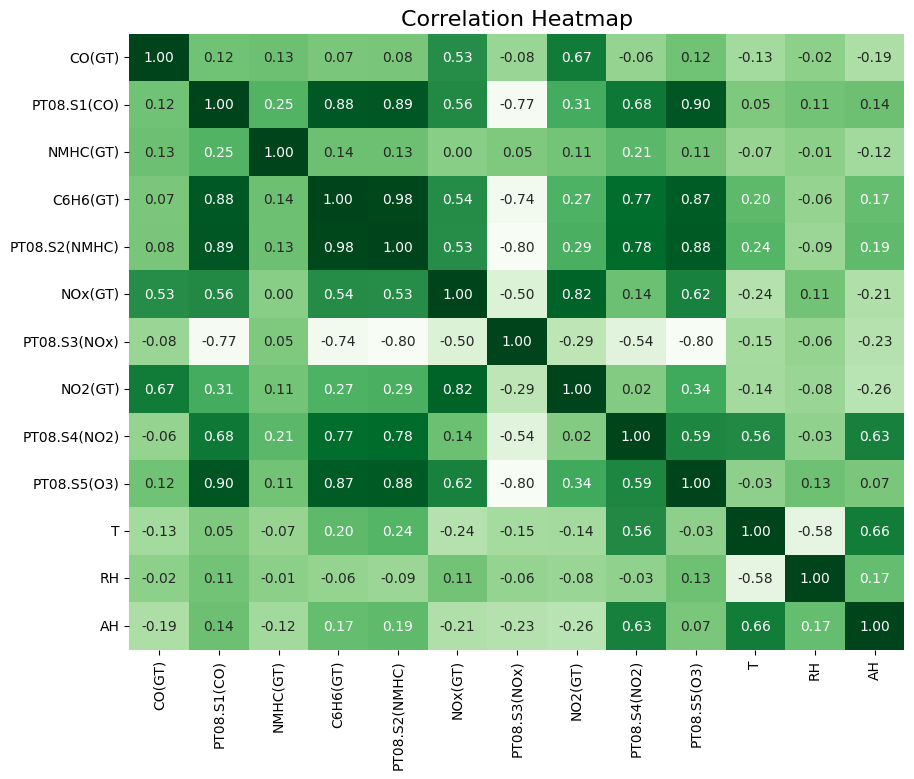

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = df_filtered.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, cmap='Greens', annot=True, fmt=".2f", cbar=False)

# Set the plot title
plt.title('Correlation Heatmap', fontsize=16)

# Show the plot
plt.show()

## Pair Plot

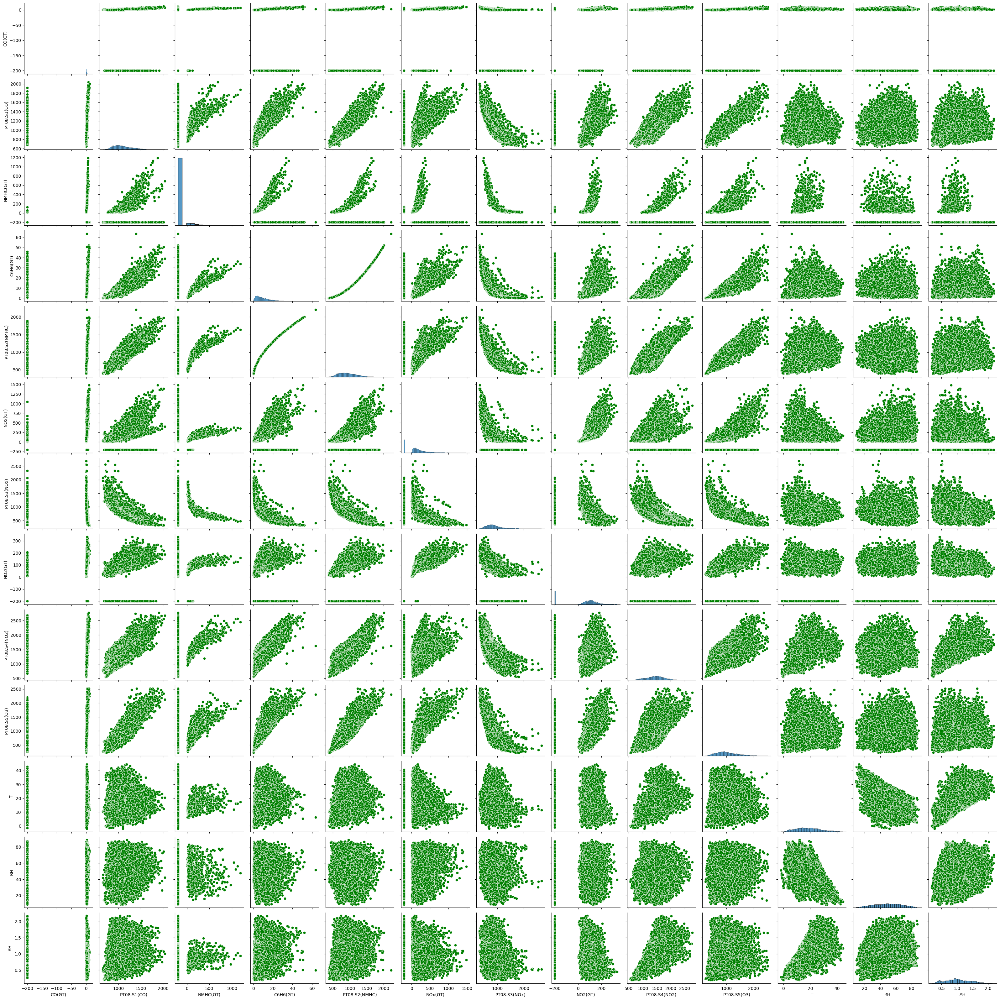

In [ ]:
import seaborn as sns

# Create the pair plot with green color
sns.pairplot(df_filtered, plot_kws={'color': 'green'})

# Display the plot
plt.show()

# Creating Y-Variable

In [ ]:
max_T = df_filtered['T'].max()
print("Maximum T:", max_T)

Maximum T: 44.6


In [ ]:
min_T = df_filtered['T'].min()
print("Minimum T:", min_T)

Minimum T: -1.9


In [ ]:
# Calculate average/mean
average_T = df_filtered['T'].mean()
print("Average T:", average_T)

# Calculate median
median_T = df_filtered['T'].median()
print("Median T:", median_T)

# Calculate mode
mode_T = df_filtered['T'].mode()
print("Mode T:", mode_T)

Average T: 18.316963292547275
Median T: 17.8
Mode T: 0    20.8
Name: T, dtype: float64


In [ ]:
count = len(df[df['T'] > 30])
print("Count of 'T' values above 30:", count)


Count of 'T' values above 30: 938


In [ ]:
total_count = len(df['T'])
print("Total count of values in 'T' column:", total_count)

Total count of values in 'T' column: 9357


In [ ]:
count = len(df[df['T'] > 25])
print("Count of 'T' values above 25:", count)

Count of 'T' values above 25: 2059


In [ ]:
df_filtered['Air Quality'] = df_filtered['T'].apply(lambda x: 1 if x > 25 else 0)

<ipython-input-198-65646193b0a5>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df_filtered.head

<bound method NDFrame.head of            Date                Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0    2004-03-10 1900-01-01 18:00:00     2.6       1360.0     150.0      11.9   
1    2004-03-10 1900-01-01 19:00:00     2.0       1292.0     112.0       9.4   
2    2004-03-10 1900-01-01 20:00:00     2.2       1402.0      88.0       9.0   
3    2004-03-10 1900-01-01 21:00:00     2.2       1376.0      80.0       9.2   
4    2004-03-10 1900-01-01 22:00:00     1.6       1272.0      51.0       6.5   
...         ...                 ...     ...          ...       ...       ...   
9352 2005-04-04 1900-01-01 10:00:00     3.1       1314.0    -200.0      13.5   
9353 2005-04-04 1900-01-01 11:00:00     2.4       1163.0    -200.0      11.4   
9354 2005-04-04 1900-01-01 12:00:00     2.4       1142.0    -200.0      12.4   
9355 2005-04-04 1900-01-01 13:00:00     2.1       1003.0    -200.0       9.5   
9356 2005-04-04 1900-01-01 14:00:00     2.2       1071.0    -200.0      11.9   

      PT0

## Target Variable Distribution

In [ ]:
y_variable = df_filtered['Air Quality']
unique_values = y_variable.unique()
print(unique_values)

[0 1]


In [ ]:
target_distribution = df_filtered['Air Quality'].value_counts()
print(target_distribution)

0    6932
1    2058
Name: Air Quality, dtype: int64


In [ ]:
import plotly.graph_objects as go

# Calculate the distribution of the target variable
target_distribution = df_filtered['Air Quality'].value_counts()

# Define the colors for "no" and "yes"
no_color = 'darkgreen'
yes_color = 'green'

# Create a bar plot
fig = go.Figure(data=[
    go.Bar(
        x=target_distribution.index,
        y=target_distribution.values,
        marker=dict(color=[no_color, yes_color])
    )
])

# Set the layout for the plot
fig.update_layout(
    title='Distribution of Target Variable',
    xaxis=dict(title='Categories'),
    yaxis=dict(title='Count'),
)

# Display the plot
fig.show()

# Feature Selection

## From Correlation Matrix

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only=True)

# Find the feature names with the highest correlation but less than 1
highest_correlation = correlation_matrix[(correlation_matrix < 1) & (correlation_matrix > 0.5)].stack()
feature_names = highest_correlation.index.tolist()

# Print the feature names
print("Feature names with the highest correlation but less than 1:")
for feature in feature_names:
    print(feature)

Feature names with the highest correlation but less than 1:
('CO(GT)', 'NOx(GT)')
('CO(GT)', 'NO2(GT)')
('PT08.S1(CO)', 'C6H6(GT)')
('PT08.S1(CO)', 'PT08.S2(NMHC)')
('PT08.S1(CO)', 'PT08.S4(NO2)')
('PT08.S1(CO)', 'PT08.S5(O3)')
('PT08.S1(CO)', 'T')
('PT08.S1(CO)', 'RH')
('PT08.S1(CO)', 'AH')
('C6H6(GT)', 'PT08.S1(CO)')
('C6H6(GT)', 'PT08.S2(NMHC)')
('C6H6(GT)', 'PT08.S3(NOx)')
('C6H6(GT)', 'PT08.S4(NO2)')
('C6H6(GT)', 'PT08.S5(O3)')
('C6H6(GT)', 'T')
('C6H6(GT)', 'RH')
('C6H6(GT)', 'AH')
('PT08.S2(NMHC)', 'PT08.S1(CO)')
('PT08.S2(NMHC)', 'C6H6(GT)')
('PT08.S2(NMHC)', 'PT08.S4(NO2)')
('PT08.S2(NMHC)', 'PT08.S5(O3)')
('PT08.S2(NMHC)', 'T')
('PT08.S2(NMHC)', 'RH')
('PT08.S2(NMHC)', 'AH')
('NOx(GT)', 'CO(GT)')
('NOx(GT)', 'NO2(GT)')
('PT08.S3(NOx)', 'C6H6(GT)')
('PT08.S3(NOx)', 'T')
('PT08.S3(NOx)', 'RH')
('PT08.S3(NOx)', 'AH')
('NO2(GT)', 'CO(GT)')
('NO2(GT)', 'NOx(GT)')
('PT08.S4(NO2)', 'PT08.S1(CO)')
('PT08.S4(NO2)', 'C6H6(GT)')
('PT08.S4(NO2)', 'PT08.S2(NMHC)')
('PT08.S4(NO2)', 'PT08.S

In [ ]:
# Calculate the correlation of the target variable against the x variables
correlation_matrix = df_filtered.corr().loc['Air Quality', :]

# Sort the correlation values in descending order
sorted_correlation = correlation_matrix.abs().sort_values(ascending=False)

# Print the feature names with their corresponding correlation values
print("Correlation of the target variable (survived) against x variables:")
for feature, correlation in sorted_correlation.iteritems():
    print(f"{feature}: {correlation}")


<ipython-input-204-b003dceb69e0>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Correlation of the target variable (survived) against x variables:
Air Quality: 1.0
T: 0.7573598117626836
RH: 0.5499872228578574
AH: 0.399839789093359
PT08.S4(NO2): 0.32322475370639053
NOx(GT): 0.1702852925003934
PT08.S2(NMHC): 0.15050181016762496
NMHC(GT): 0.11696284876354826
C6H6(GT): 0.11515309233832925
PT08.S3(NOx): 0.10348978345503747
CO(GT): 0.08520201431248622
PT08.S5(O3): 0.05266532369290263
NO2(GT): 0.05030795249810081
PT08.S1(CO): 0.00503643887834682


<ipython-input-204-b003dceb69e0>:9: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



## K-Best

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Convert 'Date' and 'Time' columns to datetime
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
df_filtered['Time'] = pd.to_datetime(df_filtered['Time'], format='%H:%M:%S').dt.time

# Create a new column combining 'Date' and 'Time' as datetime
df_filtered['DateTime'] = pd.to_datetime(df_filtered['Date'].astype(str) + ' ' + df_filtered['Time'].astype(str))

# Feature selection with SelectKBest using chi-square test
kbest = SelectKBest(score_func=chi2, k=5)

# Convert the features to numeric type if needed
numeric_columns = df_filtered.select_dtypes(include=[np.number]).columns
df_filtered[numeric_columns] = df_filtered[numeric_columns].apply(pd.to_numeric)

# Drop unnecessary columns
X = df_filtered.drop(['Air Quality', 'Date', 'Time', 'DateTime'], axis=1).values
y = df_filtered['Air Quality'].values

# Apply Min-Max scaling to ensure non-negative values
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Perform feature selection
X_selected = kbest.fit_transform(X_scaled, y)

# Get the selected feature names
selected_feature_names = df_filtered.drop(['Air Quality', 'Date', 'Time', 'DateTime'], axis=1).columns[kbest.get_support()]

# Print the selected feature names
print("Selected Features:")
for feature_name in selected_feature_names:
    print(feature_name)

# Get the scores or p-values assigned to each feature
feature_scores = kbest.scores_

# Print the selected feature names and their corresponding scores or p-values
print("Selected Features and Scores:")
for feature_name, score in zip(selected_feature_names, feature_scores):
    print(f"{feature_name}: {score}")


Selected Features:
NMHC(GT)
PT08.S4(NO2)
T
RH
AH
Selected Features and Scores:
NMHC(GT): 11.401146317413405
PT08.S4(NO2): 0.017035282354075816
T: 42.42716427188705
RH: 10.419628648055237
AH: 14.237013460524569


<ipython-input-205-28f8b806fda0>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-205-28f8b806fda0>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-205-28f8b806fda0>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-205-28f

## PCA

In [ ]:
from sklearn.decomposition import PCA

# Drop non-numeric columns from the DataFrame
numeric_columns = df_filtered.select_dtypes(include=[np.number]).columns
df_numeric = df_filtered[numeric_columns]

# Perform PCA with all components
pca = PCA()
pca.fit(df_numeric)

# Print the components
print("Principal Components:")
for i, component in enumerate(pca.components_):
    print(f"Component {i+1}: {component}")


Principal Components:
Component 1: [ 1.69172271e-02  3.24927455e-01  3.25193154e-02  1.11419077e-02
  4.08016446e-01  2.44672841e-01 -3.47074596e-01  7.23070501e-02
  4.19168422e-01  6.04328886e-01  2.25562473e-03  1.52456991e-03
  1.46094946e-04  5.09161760e-05]
Component 2: [-1.22073446e-01 -1.14866714e-02  8.64061159e-02  2.26849941e-03
  8.19954222e-02 -5.85308188e-01  9.24743380e-02 -2.70979560e-01
  7.05988269e-01 -2.17685953e-01  1.85676017e-02 -7.22589590e-03
  8.66236291e-04  5.36875508e-04]
Component 3: [-2.15897350e-01 -1.08063525e-02 -3.41416238e-01 -2.18662647e-03
 -2.32893461e-02 -4.88149484e-01 -4.55356432e-01 -3.82811319e-01
 -3.92252120e-01  2.99979521e-01 -6.05766991e-03  9.44880159e-03
 -4.98599532e-05 -1.12538251e-04]
Component 4: [-5.50272736e-02  2.21962011e-01  6.29146152e-01 -9.26653441e-05
 -7.01668339e-02 -2.38113640e-01  4.50667617e-01 -1.55773899e-01
 -2.52967043e-01  4.45098174e-01 -2.37058271e-02  1.49338477e-02
 -1.03928845e-03 -9.49184515e-04]
Component 

In [ ]:
# Convert the 'DateTime' column to datetime type
df_filtered['DateTime'] = pd.to_datetime(df_filtered['DateTime'])

# Extract the numeric features
numeric_columns = df_filtered.select_dtypes(include=np.number).columns
df_numeric = df_filtered[numeric_columns]

# Perform PCA
pca = PCA()
pca.fit(df_numeric)

# Print the explained variance of the principal components
print("Explained Variance of Principal Components:")
for i, explained_variance in enumerate(pca.explained_variance_):
    print(f"Principal Component {i+1}: {explained_variance}")


<ipython-input-207-4b8df21853bb>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Explained Variance of Principal Components:
Principal Component 1: 395100.39246878
Principal Component 2: 86761.61766892528
Principal Component 3: 32447.58868170227
Principal Component 4: 22912.586980923475
Principal Component 5: 14452.963199637017
Principal Component 6: 6522.967923820535
Principal Component 7: 4762.3408398936745
Principal Component 8: 3488.2949470789963
Principal Component 9: 2303.3318268200137
Principal Component 10: 186.90069646258598
Principal Component 11: 10.81219439742802
Principal Component 12: 1.3420554340198187
Principal Component 13: 0.06874630903907722
Principal Component 14: 0.01530935886041758


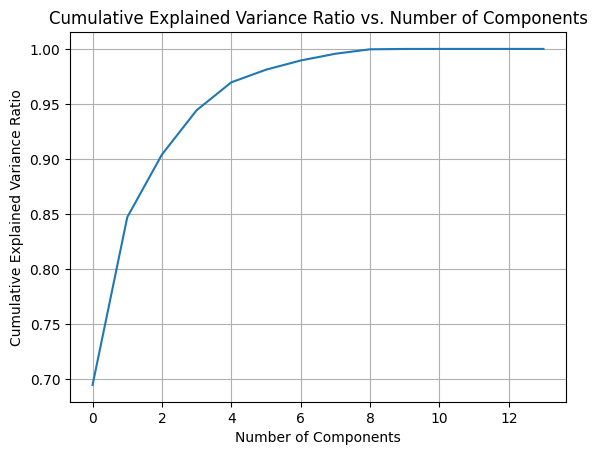

In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Get the numeric features from the DataFrame
X = df_filtered.select_dtypes(include=np.number)

# Fit PCA on the data
pca = PCA()
pca.fit(X)

# Calculate the cumulative explained variance ratio
cumulative_var_ratio = np.cumsum(pca.explained_variance_ratio_)

# Plot the cumulative explained variance ratio
plt.plot(cumulative_var_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
plt.grid(True)
plt.show()


In [ ]:
from sklearn.decomposition import PCA

# Exclude the 'Date' and 'Time' columns from the DataFrame
numeric_columns = df_filtered.select_dtypes(include='number').columns
df_filtered_numeric = df_filtered[numeric_columns]

# Perform PCA with 4 components
pca = PCA(n_components=4)
X_pca = pca.fit_transform(df_filtered_numeric)

# Print the explained variance of the principal components
print("Explained Variance of Principal Components:")
for i, explained_variance in enumerate(pca.explained_variance_):
    print(f"Principal Component {i+1}: {explained_variance}")


Explained Variance of Principal Components:
Principal Component 1: 395100.39246878
Principal Component 2: 86761.61766892528
Principal Component 3: 32447.588681702393
Principal Component 4: 22912.586980923406


In [ ]:
# Perform PCA with 4 components
pca = PCA(n_components=4)
X_pca = pca.fit_transform(df_numeric)

# Get the selected feature names
selected_feature_names = df_numeric.columns[:4]  # Select first four feature names

# Print the principal component weights
print("PCA Weights:")
for component in pca.components_:
    for weight, feature_name in zip(component, selected_feature_names):
        print(f"{feature_name}: {weight}")

PCA Weights:
CO(GT): 0.016917227111850393
PT08.S1(CO): 0.3249274553360492
NMHC(GT): 0.03251931544979973
C6H6(GT): 0.011141907734239329
CO(GT): -0.12207344624377896
PT08.S1(CO): -0.011486671423173944
NMHC(GT): 0.08640611590037571
C6H6(GT): 0.0022684994055773055
CO(GT): -0.2158973502239663
PT08.S1(CO): -0.010806352513643147
NMHC(GT): -0.34141623846871894
C6H6(GT): -0.0021866264747527333
CO(GT): -0.055027273646250166
PT08.S1(CO): 0.22196201061627058
NMHC(GT): 0.6291461523980848
C6H6(GT): -9.266534413011028e-05


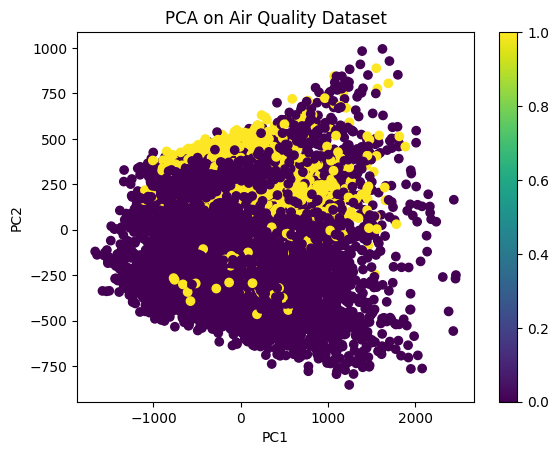

In [ ]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_filtered['Air Quality'])
plt.colorbar()
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA on Air Quality Dataset')
plt.show()

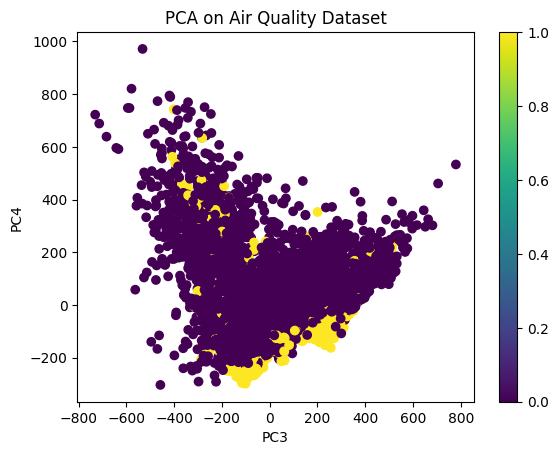

In [ ]:
plt.scatter(X_pca[:, 2], X_pca[:, 3], c=df_filtered['Air Quality'])
plt.colorbar()
plt.xlabel('PC3')
plt.ylabel('PC4')
plt.title('PCA on Air Quality Dataset')
plt.show()

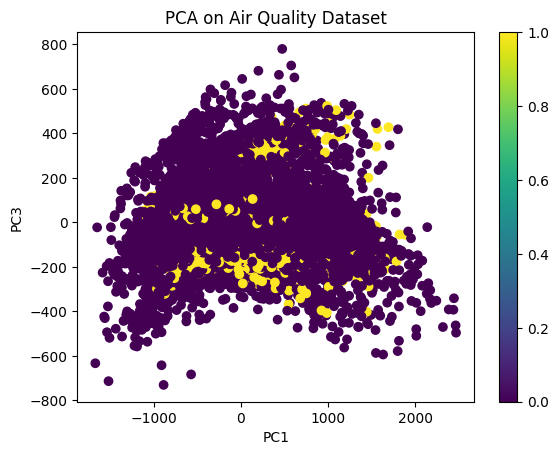

In [ ]:
plt.scatter(X_pca[:, 0], X_pca[:, 2], c=df_filtered['Air Quality'])
plt.colorbar()
plt.xlabel('PC1')
plt.ylabel('PC3')
plt.title('PCA on Air Quality Dataset')
plt.show()

## LASSO

In [ ]:
from sklearn.linear_model import Lasso
lasso = Lasso(alpha=0.2)
lasso.fit(X, y)
selected_feature_indices = np.where(lasso.coef_ != 0)[0]
selected_feature_names = df_filtered_numeric.columns[selected_feature_indices]
print("Selected Features:")
for feature_name in selected_feature_names:
    print(feature_name)

Selected Features:
CO(GT)
PT08.S1(CO)
NMHC(GT)
PT08.S2(NMHC)
NOx(GT)
PT08.S3(NOx)
NO2(GT)
PT08.S5(O3)
T
RH


# Interaction Terms

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# Select the variables for interaction term creation
X = df[['CO(GT)', 'NOx(GT)']]

# Create interaction terms using PolynomialFeatures
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_interact = poly.fit_transform(X)

# Convert the interaction terms to a DataFrame
df_interact = pd.DataFrame(X_interact, columns=['CO(GT)', 'NOx(GT)', 'CO(GT)_NOx(GT)'])

# Concatenate the interaction terms DataFrame with the original DataFrame
df_with_interact = pd.concat([df, df_interact], axis=1)

# Display the modified DataFrame with interaction terms
print(df_with_interact.head())


        Date                Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0 2004-03-10 1900-01-01 18:00:00     2.6       1360.0     150.0      11.9   
1 2004-03-10 1900-01-01 19:00:00     2.0       1292.0     112.0       9.4   
2 2004-03-10 1900-01-01 20:00:00     2.2       1402.0      88.0       9.0   
3 2004-03-10 1900-01-01 21:00:00     2.2       1376.0      80.0       9.2   
4 2004-03-10 1900-01-01 22:00:00     1.6       1272.0      51.0       6.5   

   PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
0         1046.0    166.0        1056.0    113.0        1692.0       1268.0   
1          955.0    103.0        1174.0     92.0        1559.0        972.0   
2          939.0    131.0        1140.0    114.0        1555.0       1074.0   
3          948.0    172.0        1092.0    122.0        1584.0       1203.0   
4          836.0    131.0        1205.0    116.0        1490.0       1110.0   

      T    RH      AH  CO(GT)  NOx(GT)  CO(GT)_NOx(GT)  
0  13

# BASE Logistic Regression - using top 4 features

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Define features and target variable
X = df_filtered.drop(['Date', 'Time', 'Air Quality'], axis=1)
y = df_filtered['Air Quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Drop the DateTime column from X_train and X_test
X_train = X_train.drop('DateTime', axis=1)
X_test = X_test.drop('DateTime', axis=1)

# Create a StandardScaler instance
scaler = StandardScaler()

# Scale the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a logistic regression model
model = LogisticRegression()

# Fit the model on the scaled training data
model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred = model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate additional evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Mean Squared Error (MSE):", mse)
print("R-squared (R2):", r2)
print("Root Mean Squared Error (RMSE):", rmse)

# Get the coefficients of the logistic regression model
coefficients = model.coef_[0]

# Get the corresponding feature names
feature_names = X_train.columns

# Create a DataFrame with feature names and their coefficients
coefficients_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Sort the DataFrame by coefficient values in descending order
coefficients_df = coefficients_df.sort_values(by='Coefficient', ascending=False)

# Select the top k features
k = 4
top_features = coefficients_df.head(k)['Feature']

# Print the top features
print(f"Top {k} features:")
for feature_name in top_features:
    print(feature_name)


Accuracy: 0.9938820912124583
Mean Squared Error (MSE): 0.006117908787541713
R-squared (R2): 0.966899852724595
Root Mean Squared Error (RMSE): 0.07821706199763395
Top 4 features:
T
AH
PT08.S4(NO2)
PT08.S1(CO)


## Confusion matrix

Confusion Matrix:
           Healthy  Unhealthy
Healthy       1356          2
Unhealthy        9        431


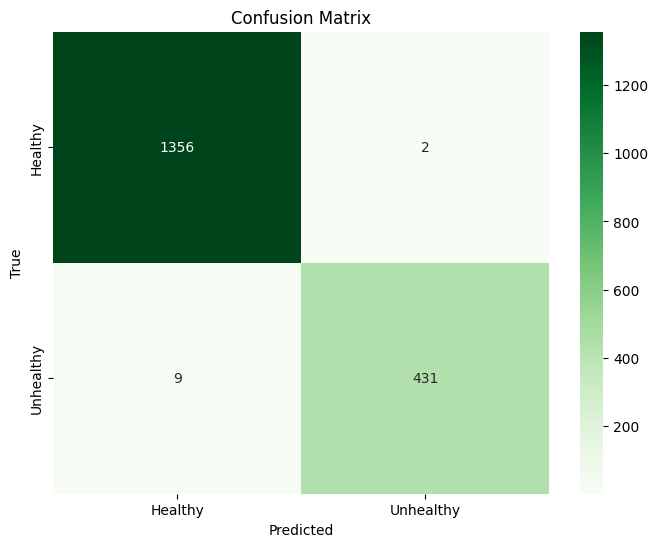

Accuracy: 0.9938820912124583


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Create confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Convert confusion matrix to DataFrame for better visualization
cm_df = pd.DataFrame(cm, index=['Healthy', 'Unhealthy'], columns=['Healthy', 'Unhealthy'])

print('Confusion Matrix:')
print(cm_df)

# Plot confusion matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, cmap='Greens', fmt='g')

plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

## F1 Score

In [ ]:
from sklearn.metrics import f1_score
# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print('F1 Score:', f1)

F1 Score: 0.9873997709049255


## Precision

In [ ]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print('Recall:', recall)

Recall: 0.9795454545454545


## Recall

In [ ]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print('Recall:', recall)

Recall: 0.9795454545454545


## ROC

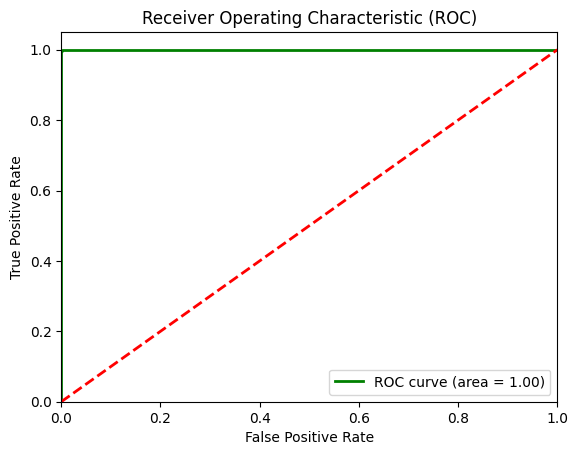

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression

# Create a logistic regression model with Lasso regularization
model = LogisticRegression(penalty='l1', solver='liblinear')

# Fit the model on the scaled training data
model.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred_prob = model.predict_proba(X_test_scaled)[:, 1]

# Compute the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Compute the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


# Using LASSO Logistic Regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Subset the DataFrame to include selected features
selected_features = ['CO(GT)', 'NMHC(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T']
X_selected = df_filtered[selected_features]

# Define target variable and input features
y = df_filtered['Air Quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Create a logistic regression model
logreg = LogisticRegression()

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Evaluate the model on the testing data
accuracy = logreg.score(X_test, y_test)
print("Accuracy:", accuracy)

# Calculate additional evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Mean Squared Error (MSE):", mse)
print("R-squared (R2):", r2)
print("Root Mean Squared Error (RMSE):", rmse)


Accuracy: 0.9638487208008899
Mean Squared Error (MSE): 0.3481646273637375
R-squared (R2): -1.0020953956437824
Root Mean Squared Error (RMSE): 0.5900547664104896


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



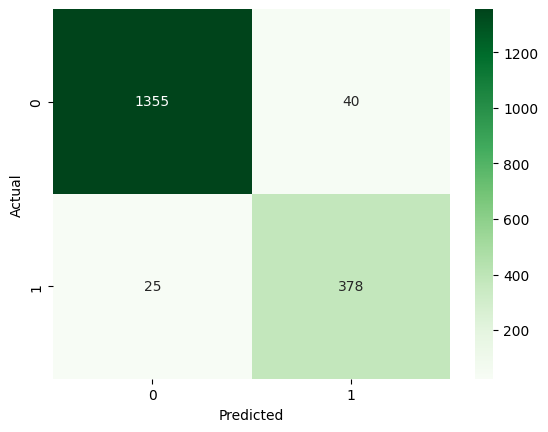

Accuracy: 0.9638487208008899


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# Obtain predicted values from the logistic regression model
y_pred = logreg.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a green heatmap using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Using KBEST - Logistic Regression

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Subset the DataFrame to include selected features
selected_features = ['NMHC(GT)', 'PT08.S4(NO2)', 'T', 'RH', 'AH']
X_selected = df_filtered[selected_features]

# Define target variable and input features
y = df_filtered['Air Quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Create a logistic regression model
logreg = LogisticRegression()

# Fit the model to the training data
logreg.fit(X_train, y_train)

# Evaluate the model on the testing data
accuracy = logreg.score(X_test, y_test)
print("Accuracy:", accuracy)

# Calculate additional evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Mean Squared Error (MSE):", mse)
print("R-squared (R2):", r2)
print("Root Mean Squared Error (RMSE):", rmse)

Accuracy: 0.9983314794215795
Mean Squared Error (MSE): 0.036151279199110126
R-squared (R2): 0.7921146953405018
Root Mean Squared Error (RMSE): 0.19013489737318115


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



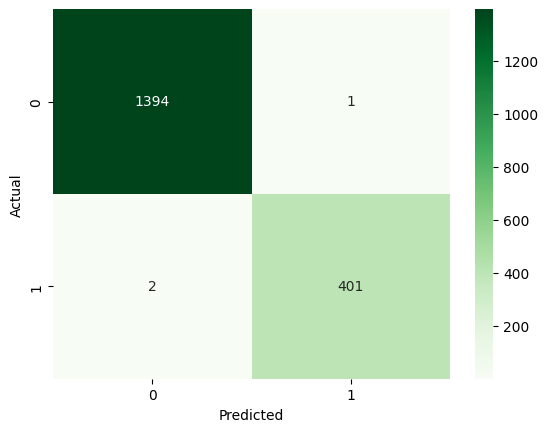

Accuracy: 0.9983314794215795
Mean Squared Error (MSE): 0.0016685205784204673
R-squared (R2): 0.9904052936311001
Root Mean Squared Error (RMSE): 0.040847528424868836


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

# Obtain predicted values from the logistic regression model
y_pred = logreg.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create a green heatmap using seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Calculate additional evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Mean Squared Error (MSE):", mse)
print("R-squared (R2):", r2)
print("Root Mean Squared Error (RMSE):", rmse)


# Decison Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

selected_features = [5, 8, 10, 11, 12]
X_selected = X.iloc[:, selected_features]

# Initialize the decision tree classifier with the desired hyperparameters
clf = DecisionTreeClassifier()

# Fit the classifier to your data
clf.fit(X_selected, y)


DecisionTreeClassifier()

Accuracy: 0.9588431590656284


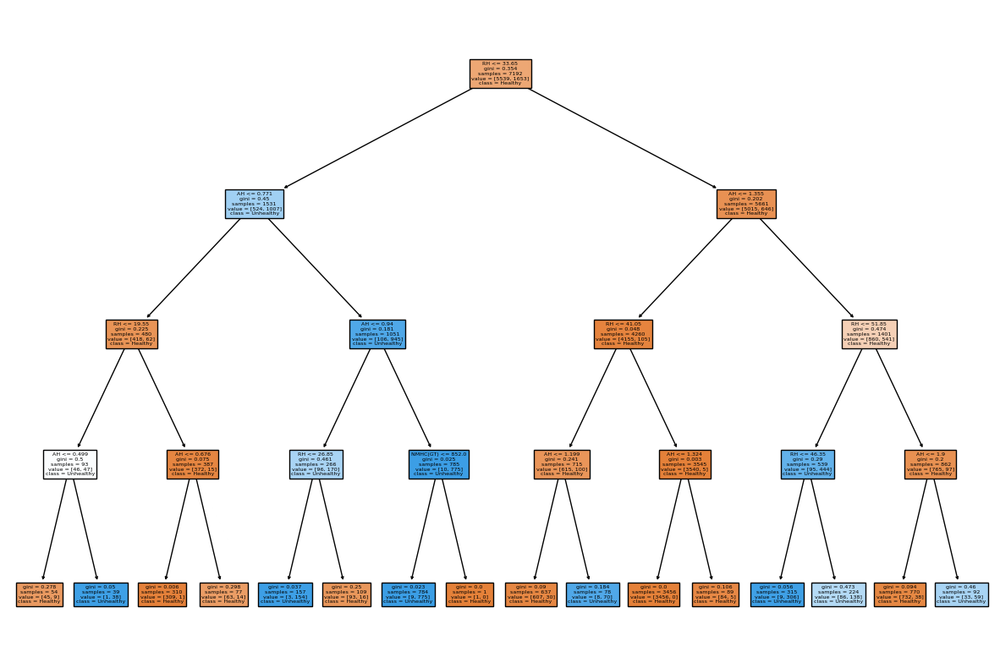

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Define features and target variable
X = df_filtered[['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)',
        'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'RH', 'AH']]
y = df_filtered['Air Quality']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Create a decision tree classifier
clf = DecisionTreeClassifier(max_depth=4)

# Fit the model to the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Visualize the decision tree
plt.figure(figsize=(15, 10))
plot_tree(clf, feature_names=X.columns, class_names=['Healthy', 'Unhealthy'], filled=True)
plt.show()



In [ ]:
X.head(10)

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),RH,AH
0,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,48.9,0.7578
1,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,47.7,0.7255
2,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,54.0,0.7502
3,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,60.0,0.7867
4,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,59.6,0.7888
5,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,59.2,0.7848
6,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,56.8,0.7603
7,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,60.0,0.7702
8,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,59.7,0.7648
9,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,60.2,0.7517


In [ ]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()

# Fit the classifier to your data
clf.fit(X, y)

# Get the feature importances
feature_importances = clf.feature_importances_

# Print the feature importances
for feature_name, importance in zip(X.columns, feature_importances):
    print(f"Feature: {feature_name}, Importance: {importance}")


Feature: CO(GT), Importance: 0.0013470744351126475
Feature: PT08.S1(CO), Importance: 0.001755958073109621
Feature: NMHC(GT), Importance: 0.0
Feature: C6H6(GT), Importance: 0.0
Feature: PT08.S2(NMHC), Importance: 0.001437313085062821
Feature: NOx(GT), Importance: 0.0007669210621612763
Feature: PT08.S3(NOx), Importance: 0.0008136029160340287
Feature: NO2(GT), Importance: 0.00042011144028407946
Feature: PT08.S4(NO2), Importance: 0.0035367231570212145
Feature: PT08.S5(O3), Importance: 0.0010866040259979184
Feature: RH, Importance: 0.5641521292033476
Feature: AH, Importance: 0.42468356260186896


In [ ]:
import plotly.graph_objects as go

# Define the features and importances
features = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'RH', 'AH']
importances = [0.0017181728740302505, 0.003260532993979198, 0.0, 0.0, 0.001964521115995076, 0.0003468096218771968, 0.001395295679504292, 0.0, 0.0022416653518830564, 0.0020437897507360765, 0.5674102665277662, 0.41961894608422873]

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=features, y=importances, marker_color='green')])

# Customize the layout
fig.update_layout(
    title="Feature Importances",
    xaxis=dict(title="Feature"),
    yaxis=dict(title="Importance"),
    xaxis_tickangle=-45
)

# Show the plot
fig.show()


## Confusion matrix

Confusion Matrix:
           Healthy  Unhealthy
Healthy       1352         41
Unhealthy       33        372


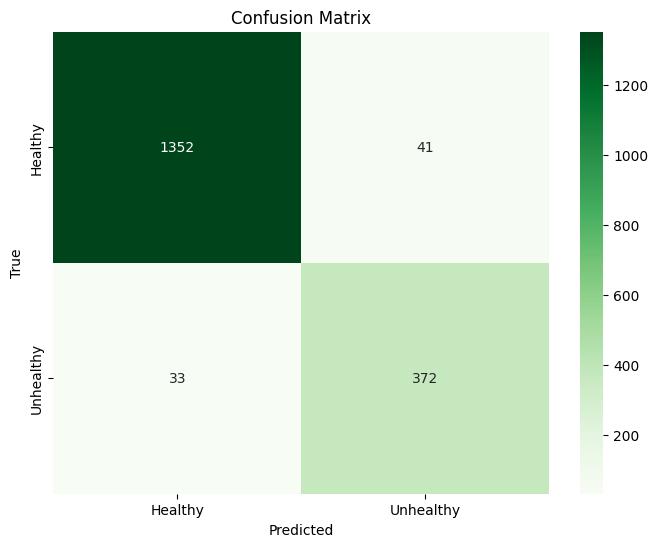

Accuracy: 0.9588431590656284


In [ ]:
# Create confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Convert confusion matrix to DataFrame for better visualization
cm_df = pd.DataFrame(cm, index=['Healthy', 'Unhealthy'], columns=['Healthy', 'Unhealthy'])

print('Confusion Matrix:')
print(cm_df)

# Plot confusion matrix using Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, cmap='Greens', fmt='g')

plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')

plt.show()

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

## F1 Score

In [ ]:
from sklearn.metrics import accuracy_score, f1_score
# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print('F1 Score:', f1)

F1 Score: 0.9095354523227382


## Precision

In [ ]:
# Calculate precision
precision = precision_score(y_test, y_pred)
print('Precision:', precision)

Precision: 0.9007263922518159


## Recall

In [ ]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print('Recall:', recall)

Recall: 0.9185185185185185


# Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Create a Gaussian Naive Bayes classifier
classifier = GaussianNB()

# Train the classifier on the training data
classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = classifier.predict(X_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8743047830923248


## Confusion matrix

Confusion Matrix:
[[1191  158]
 [  68  381]]


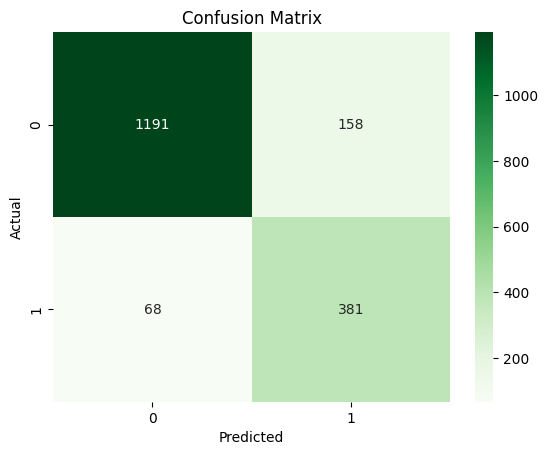

In [ ]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Create a heatmap of the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


## F1 Score

In [ ]:
# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print('F1 Score:', f1)

F1 Score: 0.771255060728745


## Precision

In [ ]:
# Calculate precision
precision = precision_score(y_test, y_pred)
print('Precision:', precision)

Precision: 0.7068645640074211


## Recall

In [ ]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print('Recall:', recall)

Recall: 0.8485523385300668


## ROC

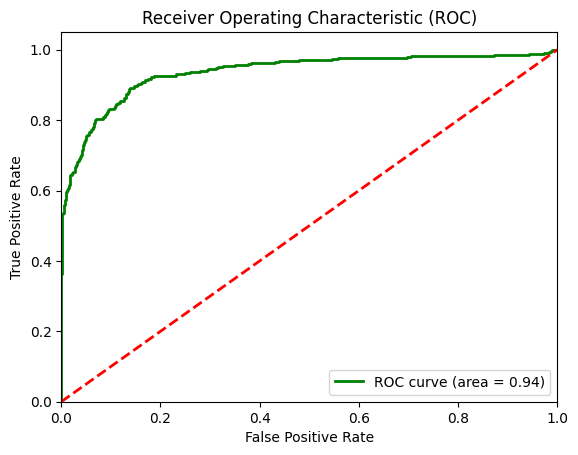

In [ ]:
# Make predictions on the testing data
y_pred_prob = classifier.predict_proba(X_test)[:, 1]

# Compute the ROC curve and area under the curve (AUC)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
#plt.plot(fpr2, tpr2, color='green', lw=2, label='ROC curve (area = %0.2f)' % roc_auc2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

# KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
k = 5
knn = KNeighborsClassifier(n_neighbors=k)
knn.fit(X_train_scaled, y_train)
y_pred = knn.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.7152391546162402


## Confusion matrix

Confusion Matrix:
[[1253   96]
 [ 416   33]]


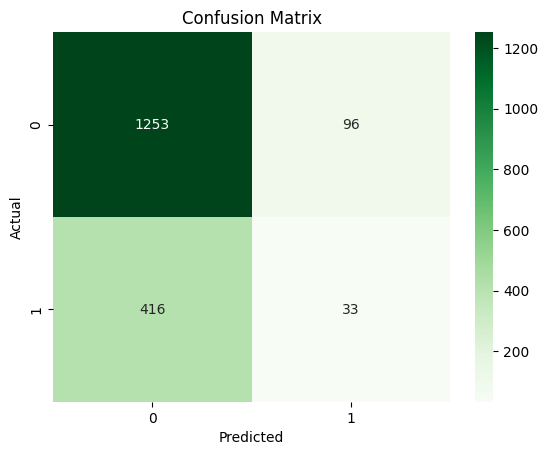

In [ ]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

# Create a heatmap of the confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## F1 Score

In [ ]:
# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print('F1 Score:', f1)

F1 Score: 0.11418685121107265


## Precision

In [ ]:
# Calculate precision
precision = precision_score(y_test, y_pred)
print('Precision:', precision)

Precision: 0.2558139534883721


## Recall

In [ ]:
# Calculate recall
recall = recall_score(y_test, y_pred)
print('Recall:', recall)

Recall: 0.07349665924276169


## ROC

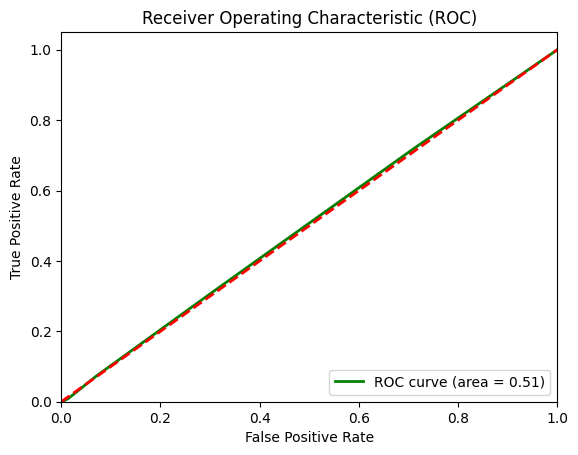

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Fit the KNN model on the scaled training data
knn.fit(X_train_scaled, y_train)

# Obtain the predicted probabilities for the positive class
y_pred_prob = knn.predict_proba(X_test_scaled)[:, 1]

# Compute the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Compute the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()
